# Independent Experimental Dataset and Calibration Dataset

This notebook prepares the independent clinopyroxene-liquid experimental dataset, performs data cleaning and equilibrium checks, and generates dataset and calibration-comparison figures used in the paper.


# Modules and data imports

In [1]:
from pathlib import Path
import sys

def _find_project_root(start=None):
    """Find the project root by walking upward from the current directory."""
    path = Path.cwd() if start is None else Path(start).resolve()
    for candidate in (path, *path.parents):
        if (candidate / "pyproject.toml").exists():
            return candidate
    raise FileNotFoundError("Could not find pyproject.toml above the current directory.")

PROJECT_ROOT = _find_project_root()
PAPER_DIR = PROJECT_ROOT / "paper"
CACHE_DIR = PAPER_DIR / ".cache"
IMAGES_DIR = PAPER_DIR / ".images"
DATA_DIR = PAPER_DIR / "data"
for _dir in (CACHE_DIR, IMAGES_DIR, DATA_DIR):
    _dir.mkdir(parents=True, exist_ok=True)

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np

import os
import time
import importlib
import matplotlib.pyplot as plt
from aims4pt.model_tools.model_registry import  get_models_initial_pools, ALL_MODELS_MODULES
from aims4pt.model_tools.ModelManager import ModelManager
for module in ALL_MODELS_MODULES:
    importlib.import_module(module)





calculate_shap = False # make sure this to False when not needed, as it takes time and memory

timestamp = time.strftime("%Y%m%d_%H%M")


# Independent Experimental Dataset 
Apply cpx oxide-total screening, cpx stoichiometric screening, and Fe-Mg Kd equilibrium filtering.

In [2]:
unseen_experiments_path = os.path.join(DATA_DIR, "independent_data_raw.xlsx")

unseen_experiments_df = pd.read_excel(unseen_experiments_path)

#col names for unseen_experiments_df
cpx_names = ['SiO2_cpx', 'TiO2_cpx', 'Al2O3_cpx',
        'Cr2O3_cpx', 'FeO_cpx', 'MnO_cpx', 'MgO_cpx', 'NiO_cpx',
       'CaO_cpx', 'Na2O_cpx', 'K2O_cpx', 'P2O5_cpx']
liq_names = ['SiO2_liq', 'TiO2_liq', 'Al2O3_liq',
        'FeO_liq', 'MnO_liq', 'MgO_liq', 
       'CaO_liq', 'Na2O_liq', 'K2O_liq', 'P2O5_liq']
P_col = 'P (kbar)'
T_col = 'T (C)'


## Cleaning and equilibrium filtering



In [3]:
print("Before cleaning, unseen_experiments_df shape:", unseen_experiments_df.shape)
cpx_total = unseen_experiments_df[cpx_names].sum(axis=1)
unseen_experiments_df = unseen_experiments_df[(cpx_total>98)&(cpx_total<102)].reset_index(drop=True)
print("After total, unseen_experiments_df shape:", unseen_experiments_df.shape)
from aims4pt.data_tools.compositions import cpx_calculation
cpx_params = cpx_calculation(unseen_experiments_df[cpx_names])
MdivT= cpx_params["(Ca+Fe+Mg)/Si"]
unseen_experiments_df = unseen_experiments_df[(MdivT>0.9)&(MdivT<1.1)].reset_index(drop=True)
print("After cpx MdivT, unseen_experiments_df shape:", unseen_experiments_df.shape)
# kd filter


from aims4pt.data_tools.equilibrium import kdEquilibrium_test
mask, kd_values = kdEquilibrium_test(
    unseen_experiments_df[cpx_names],
    unseen_experiments_df[liq_names],
    kd = 0.28,
    error = 0.08,
    mode='Fe-Mg',)
unseen_experiments_df = unseen_experiments_df[mask].reset_index(drop=True)
print("After kd filter, unseen_experiments_df shape:", unseen_experiments_df.shape)
liq_total = unseen_experiments_df[liq_names].sum(axis=1)
liq_total.describe()

Before cleaning, unseen_experiments_df shape: (517, 31)
After total, unseen_experiments_df shape: (497, 31)
After cpx MdivT, unseen_experiments_df shape: (441, 31)
After kd filter, unseen_experiments_df shape: (293, 31)


count    293.000000
mean      98.311839
std        2.698965
min       86.961390
25%       97.770000
50%       99.813648
75%      100.000000
max      100.660000
dtype: float64

In [4]:

cpx_unseen = unseen_experiments_df[cpx_names].copy()
liq_unseen = unseen_experiments_df[liq_names].copy()
meta_unseen = unseen_experiments_df[[P_col, T_col]].copy()
# stratified split
from sklearn.model_selection import StratifiedShuffleSplit

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
P_values = unseen_experiments_df[P_col]
target_bin_size = 50
num_bins = max(2, min(10, len(P_values) // target_bin_size))
P_binned = pd.qcut(P_values, q=num_bins, labels=False, duplicates="drop")
(strat_train_idx, strat_test_idx), = sss.split(unseen_experiments_df, P_binned)
training_unseen_id = unseen_experiments_df.iloc[strat_train_idx].index
testing_unseen_id = unseen_experiments_df.iloc[strat_test_idx].index

#random split
# from sklearn.model_selection import train_test_split
# training_unseen_id, testing_unseen_id = train_test_split(
#     unseen_experiments_df.index,
#     test_size=0.2,
#     random_state=42,
#     )


In [5]:
num_bins

5

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 37818 (\N{CJK UNIFIED IDEOGRAPH-93BA}) missing from current font.
  func(*args, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 30703 (\N{CJK UNIFIED IDEOGRAPH-77EF}) missing from current font.
  func(*args, **kwargs)


T range:  700.0  -  1350.0
P range:  0.001  -  30.0


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 37818 (\N{CJK UNIFIED IDEOGRAPH-93BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 30703 (\N{CJK UNIFIED IDEOGRAPH-77EF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


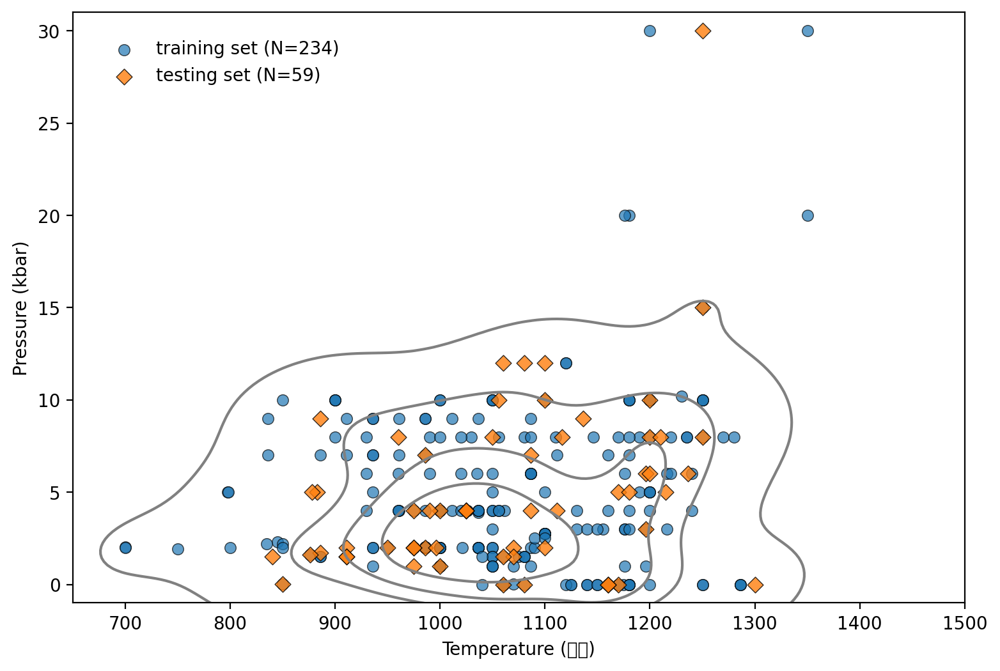

In [6]:
# P-T scatter plot for unseen test set
import seaborn as sns
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)
# training set
ax.scatter(meta_unseen.loc[training_unseen_id][T_col], meta_unseen.loc[training_unseen_id][P_col], 
           alpha=0.7, label=f'training set (N={len(training_unseen_id)})', marker='o', s =40, edgecolors='k', linewidths=0.5)
sns.kdeplot(
    data=meta_unseen,
    x=T_col,
    y=P_col,
    levels=5,
    linewidth = 0.8,
    color = "grey"
)
# testing set
ax.scatter(meta_unseen.loc[testing_unseen_id][T_col], meta_unseen.loc[testing_unseen_id][P_col], 
           alpha=0.8, label=f'testing set (N={len(testing_unseen_id)})', marker='D', s= 40, edgecolors='k', linewidths=0.5)
# sns.kdeplot( 
#     data=meta_unseen,
#     x=T_col,
#     y=P_col,
#     levels=5,
#     color='red',)
ax.set_xlabel("Temperature (鎺矯)")
ax.set_ylabel("Pressure (kbar)")
ax.set_xlim(650,1500)
ax.set_ylim(-1, 31)
# in axes legend upper left
ax_tp = ax.transAxes
ax.legend(loc = 'upper left', frameon=False,
          fontsize=10,         bbox_to_anchor=(0.02, 0.98),          # Upper-left inside the axes.
        bbox_transform=ax_tp  )

# print p t max min
print("T range: ", meta_unseen[T_col].min(), " - ", meta_unseen[T_col].max())
print("P range: ", meta_unseen[P_col].min(), " - ", meta_unseen[P_col].max())


## Comparison with GEORO

C:\Users\13493\AppData\Local\Temp\ipykernel_74548\3853685169.py:3: DtypeWarning: Columns (1,2,3,4,9,12,13,16,17,18,19,20,21,22,23,24,28,29,37,40,41,42,46,52,53,54,55,78,80,83,86,98,100,102,104,115,117,122,124,129,131,133,135,141,143,149,161,163,166,170,173,176,185,196,198,202,205,208,211,214,217,220,224,227,230,233,236,239,242,245,248,251,272,283,287,291,293,294,302,305,312,314,318,329,330,332,333,339,341,348,349,350,351,359,360,363,366,368,395,416,449,452) have mixed types. Specify dtype option on import or set low_memory=False.
  georoc_df_raw=pd.read_csv(os.path.join(DATA_DIR, "GEOROC_cpx.csv"))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


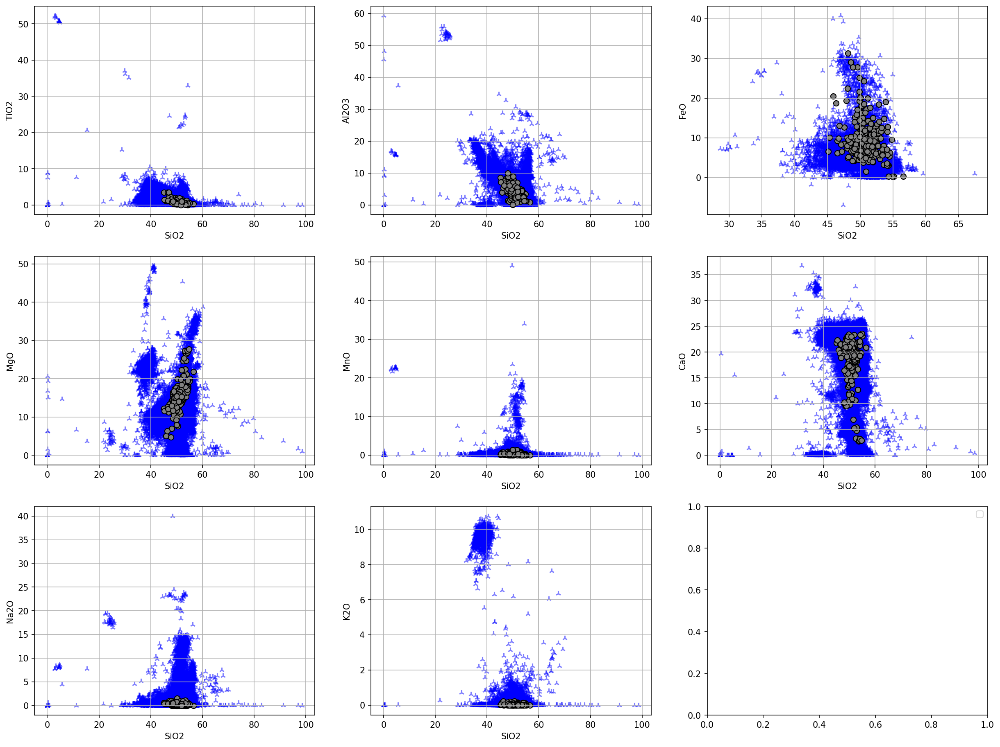

In [7]:
run_compare_natural_exp_dataset = True
if run_compare_natural_exp_dataset:
    georoc_df_raw=pd.read_csv(os.path.join(DATA_DIR, "GEOROC_cpx.csv"))

    xy_pairs = [("SiO2", "TiO2"), ("SiO2", "Al2O3"), ("SiO2", "FeO"),
                ("SiO2", "MgO"), ("SiO2", "MnO"), ("SiO2", "CaO"),
                ("SiO2", "Na2O"), ("SiO2", "K2O")]
    georoc_df = georoc_df_raw.rename(columns = {
        "SIO2(WT%)":"SiO2_cpx",
        "TIO2(WT%)":"TiO2_cpx",
        "AL2O3(WT%)":"Al2O3_cpx",
        "FEO(WT%)":"FeO_cpx",
        "MNO(WT%)":"MnO_cpx",
        "MGO(WT%)":"MgO_cpx",
        "CAO(WT%)":"CaO_cpx",
        "NA2O(WT%)":"Na2O_cpx",
        "K2O(WT%)":"K2O_cpx",
        
    })

    interested_cpx_features = ["SiO2_cpx", "TiO2_cpx", "Al2O3_cpx",
    "FeO_cpx", "MnO_cpx", "MgO_cpx", "CaO_cpx",
        "Na2O_cpx", "K2O_cpx"]

    for ele in interested_cpx_features:
        georoc_df[ele] = pd.to_numeric(georoc_df[ele], errors='coerce')

    from aims4pt.visualization.composition_plot import compare_natural_exp_dataset
    compare_natural_exp_dataset(
        georoc_df[interested_cpx_features],
        unseen_experiments_df[interested_cpx_features],
        xy_pairs,
    )

# Initial all thermobarometry models

In [8]:
P_model_pool = get_models_initial_pools("P", "both" , False) # get all P models including cpx_only and cpx_liq
P_model_names = list(model.model_name for model in P_model_pool)
T_model_pool = get_models_initial_pools("T", "both" , False) # get all T models including cpx_only and cpx_liq
T_model_names = list(model.model_name for model in T_model_pool)


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

[skipped] Error initializing model <class 'aims4pt.model_tools.Neave_Putirka_17.Neave_Putirka_17'> with T: Pu08_eq33_T, P: eq1_P - Neave_Putirka_17 only supports pressure (P) calculations, not temperature (T) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

In [9]:
P_model_dict = {model.model_name: model for model in P_model_pool}
T_model_dict = {model.model_name: model for model in T_model_pool}

In [10]:
P_model_dict

{'Putirka, 2008 eq32d_T; eq32a_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32a_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.1 kbar
         comment: None
         ,
 'Putirka, 2008 eq32d_T; eq32b_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32b_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: True
         uncertainty: 2.6 kbar
         comment: None
         ,
 'Petrelli et al., 2020 (cpx_only)': 
         ModelManager: Petrelli20
         Model name: Petrelli et al., 2020 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.2 kbar
         comment: None
         ,
 'Higgins et al., 2021 (cpx_only)': 
         ModelManager: Higgins21
         Model name: Higgins et al., 2021 (cpx_only)
         interested parameter: P; cpx-only
       

# Independent dataset

Prepare the independent dataset panels that provide the data source for Figure 5.

## TAS and P-T panels

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_fun

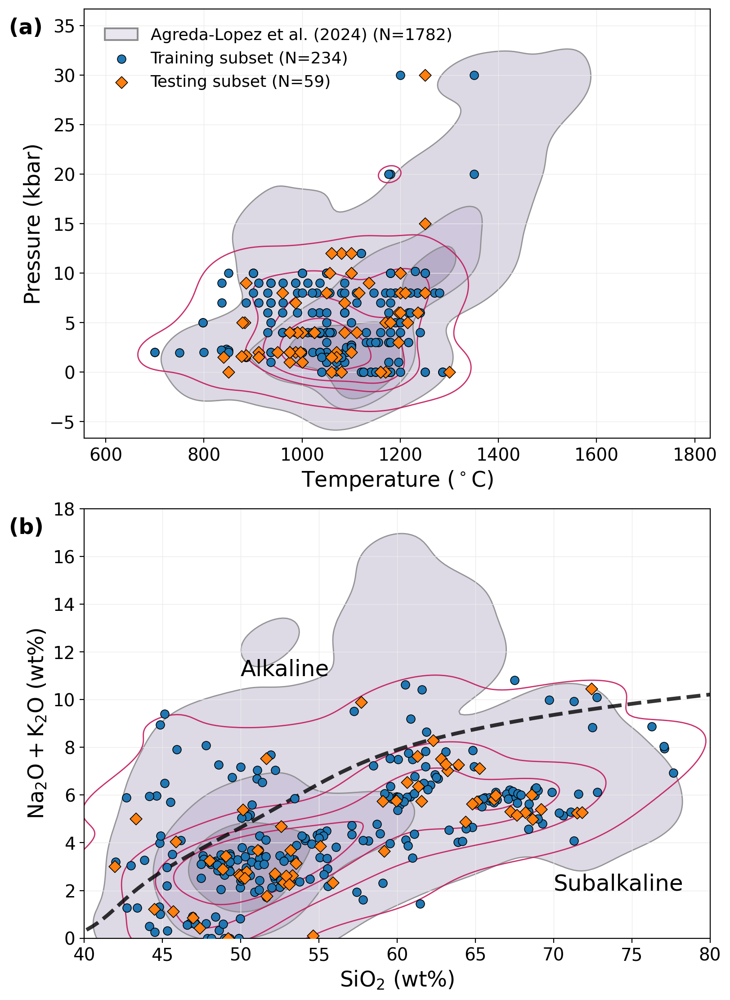

Agreda-Lopez reference P-T points: 1782
Agreda-Lopez reference TAS points: 1782
Training independent P-T points: 234
Testing independent P-T points: 59


In [11]:
from paper.scripts.figure_helpers import (
    _get_agreda_reference_model__nb00_c16 as _get_agreda_reference_model,
    apply_figure_font_sizes,
    plot_independent_pt_distribution__nb00_c18 as plot_independent_pt_distribution,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt


reference_label = "Agreda-Lopez et al. (2024)"

agreda_P_model = _get_agreda_reference_model("P")
agreda_T_model = _get_agreda_reference_model("T")

agreda_reference_pt = agreda_P_model.X_cpx_all.copy()
agreda_reference_t = agreda_T_model.X_cpx_all.copy()
if "Sample_ID" in agreda_reference_pt.columns and "Sample_ID" in agreda_reference_t.columns:
    agreda_reference_t = agreda_reference_t[["Sample_ID", "T_C"]].dropna(subset=["T_C"]).drop_duplicates("Sample_ID")
    agreda_reference_pt = agreda_reference_pt.drop(columns=["T_C"], errors="ignore").merge(
        agreda_reference_t,
        on="Sample_ID",
        how="left",
    )
elif "T_C" not in agreda_reference_pt.columns and len(agreda_reference_pt) == len(agreda_reference_t):
    agreda_reference_pt["T_C"] = agreda_reference_t["T_C"].to_numpy()
agreda_reference_pt = agreda_reference_pt.dropna(subset=["T_C", "P_kbar"])
agreda_reference_liq = agreda_P_model.X_liq_all.copy()

fig, axes = plot_independent_pt_distribution(
    meta_unseen,
    training_unseen_id,
    testing_unseen_id,
    T_col,
    P_col,
    agreda_reference_pt,
    agreda_reference_liq=agreda_reference_liq,
    liq_unseen=liq_unseen,
    reference_label=reference_label,
    figsize=(8.0, 11.0),
    dpi=200,
)
apply_figure_font_sizes(fig)
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_4_independent_dataset")
plt.show()

print(f"Agreda-Lopez reference P-T points: {len(agreda_reference_pt)}")
print(f"Agreda-Lopez reference TAS points: {len(agreda_reference_liq.dropna(subset=['SiO2_liq', 'Na2O_liq', 'K2O_liq']))}")
print(f"Training independent P-T points: {len(meta_unseen.loc[training_unseen_id].dropna(subset=[T_col, P_col]))}")
print(f"Testing independent P-T points: {len(meta_unseen.loc[testing_unseen_id].dropna(subset=[T_col, P_col]))}")


## Comparison of Independent Dataset and Calibration dataset

Generate the combined P-T, TAS, and Cpx composition comparison figure for the independent dataset and reference calibration dataset.

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_fun

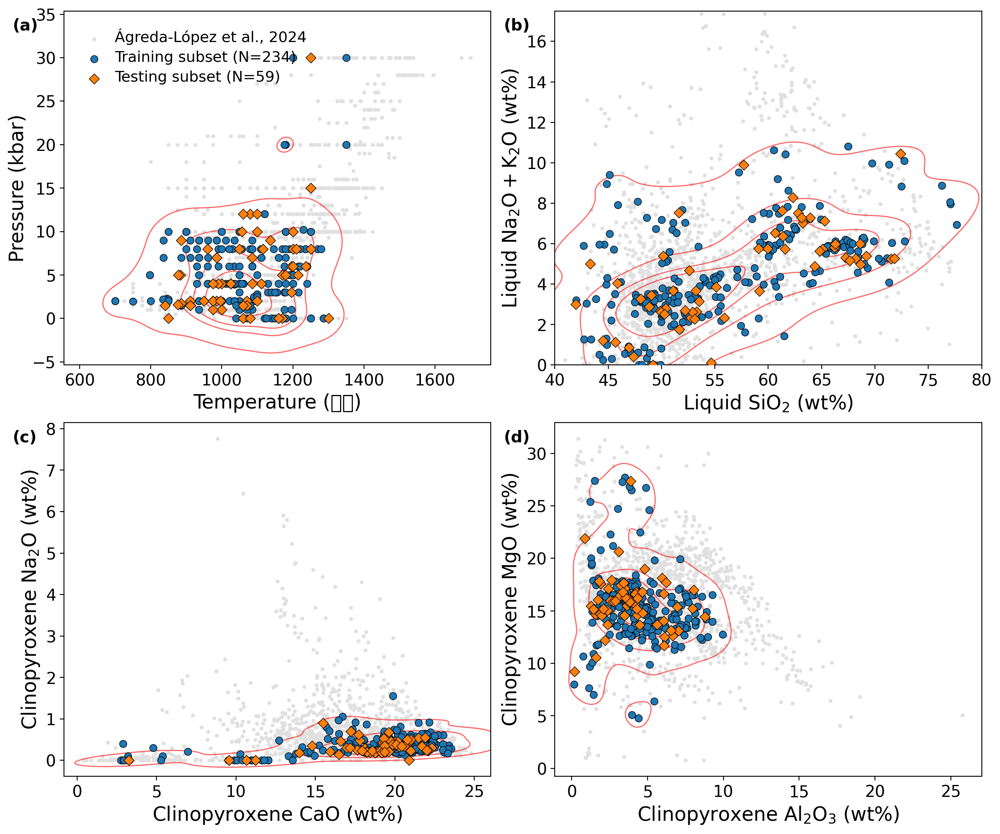

In [12]:
from paper.scripts.figure_helpers import (
    _get_agreda_reference_model__nb00_c18 as _get_agreda_reference_model,
    _panel_label__nb00_c18 as _panel_label,
    _set_pair_limits__nb00_c18 as _set_pair_limits,
    _valid_xy__nb00_c18 as _valid_xy,
    apply_figure_font_sizes,
    save_figure_pdf_png,
)

# CELL: combined 2x2 P-T, TAS, and cpx composition comparison figure
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


# Select one unified reference calibration dataset; switch this model here if needed later.
reference_label = "Ágreda-López et al., 2024"


agreda_P_model = _get_agreda_reference_model("P")
agreda_T_model = _get_agreda_reference_model("T")

agreda_reference_pt = agreda_P_model.X_cpx_all.copy()
agreda_reference_t = agreda_T_model.X_cpx_all.copy()
if "Sample_ID" in agreda_reference_pt.columns and "Sample_ID" in agreda_reference_t.columns:
    agreda_reference_t = agreda_reference_t[["Sample_ID", "T_C"]].dropna(subset=["T_C"]).drop_duplicates("Sample_ID")
    agreda_reference_pt = agreda_reference_pt.drop(columns=["T_C"], errors="ignore").merge(
        agreda_reference_t,
        on="Sample_ID",
        how="left",
    )
elif "T_C" not in agreda_reference_pt.columns and len(agreda_reference_pt) == len(agreda_reference_t):
    agreda_reference_pt["T_C"] = agreda_reference_t["T_C"].to_numpy()
agreda_reference_pt = agreda_reference_pt.dropna(subset=["T_C", "P_kbar"])

agreda_reference_liq = agreda_P_model.X_liq_all.copy()
agreda_reference_cpx = agreda_P_model.X_cpx_all.copy()

# Use the same cpx element pairs as the previous composition cell.
default_cpx_pairs = [
    ("CaO_cpx", "Na2O_cpx", r"Clinopyroxene $\mathrm{CaO}$ (wt%)", r"Clinopyroxene $\mathrm{Na_2O}$ (wt%)"),
    ("Al2O3_cpx", "MgO_cpx", r"Clinopyroxene $\mathrm{Al_2O_3}$ (wt%)", r"Clinopyroxene $\mathrm{MgO}$ (wt%)"),
]
cpx_composition_pairs = default_cpx_pairs[:2]




fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(12, 10),
    dpi=200,
    layout="constrained",
)
ax_pt, ax_tas, ax_cpx1, ax_cpx2 = axes.ravel()

# (a) P-T comparison
ax_pt.scatter(
    agreda_reference_pt["T_C"],
    agreda_reference_pt["P_kbar"],
    color="0.88",
    label=reference_label,
    marker="o",
    s=12,
    linewidths=0,
    alpha=1,
    zorder=0,
)
sns.kdeplot(
    data=meta_unseen.loc[training_unseen_id],
    x=T_col,
    y=P_col,
    levels=5,
    linewidth=0.8,
    color="red",
    alpha=0.6,
    ax=ax_pt,
    zorder=1,
)
ax_pt.scatter(
    meta_unseen.loc[training_unseen_id][T_col],
    meta_unseen.loc[training_unseen_id][P_col],
    alpha=1,
    label=f"Training subset (N={len(training_unseen_id)})",
    marker="o",
    s=40,
    edgecolors="k",
    linewidths=0.5,
    zorder=3,
)
ax_pt.scatter(
    meta_unseen.loc[testing_unseen_id][T_col],
    meta_unseen.loc[testing_unseen_id][P_col],
    alpha=1,
    label=f"Testing subset (N={len(testing_unseen_id)})",
    marker="D",
    s=40,
    edgecolors="k",
    linewidths=0.5,
    zorder=4,
)
ax_pt.set_xlabel("Temperature (鎺矯)", fontsize=14)
ax_pt.set_ylabel("Pressure (kbar)", fontsize=14)
ax_pt.tick_params(axis="both", labelsize=12)
ax_pt.legend(loc="upper left", frameon=False, fontsize=10, bbox_to_anchor=(0.02, 0.98), bbox_transform=ax_pt.transAxes)
_panel_label(ax_pt, "(a)")

# (b) TAS comparison
alkaline_wt = liq_unseen["Na2O_liq"] + liq_unseen["K2O_liq"]
sio2_wt = liq_unseen["SiO2_liq"]
agreda_alkaline_wt = agreda_reference_liq["Na2O_liq"] + agreda_reference_liq["K2O_liq"]
agreda_sio2_wt = agreda_reference_liq["SiO2_liq"]
agreda_tas_mask = np.isfinite(agreda_sio2_wt) & np.isfinite(agreda_alkaline_wt)

ax_tas.scatter(
    agreda_sio2_wt.loc[agreda_tas_mask],
    agreda_alkaline_wt.loc[agreda_tas_mask],
    color="0.88",
    label=reference_label,
    marker="o",
    s=12,
    linewidths=0,
    alpha=1,
    zorder=0,
)
sns.kdeplot(
    x=sio2_wt.loc[training_unseen_id],
    y=alkaline_wt.loc[training_unseen_id],
    levels=5,
    linewidth=0.8,
    color="red",
    alpha=0.6,
    ax=ax_tas,
    zorder=1,
)
ax_tas.scatter(
    sio2_wt.loc[training_unseen_id],
    alkaline_wt.loc[training_unseen_id],
    color="C0",
    label=f"Training subset (N={len(training_unseen_id)})",
    marker="o",
    s=40,
    linewidth=0.5,
    edgecolors="k",
    alpha=1,
    zorder=3,
)
ax_tas.scatter(
    sio2_wt.loc[testing_unseen_id],
    alkaline_wt.loc[testing_unseen_id],
    color="C1",
    marker="D",
    label=f"Testing subset (N={len(testing_unseen_id)})",
    s=40,
    linewidth=0.5,
    edgecolors="k",
    alpha=1,
    zorder=4,
)
ax_tas.set_xlabel(r"Liquid $\mathrm{SiO_2}$ (wt%)", fontsize=14)
ax_tas.set_ylabel(r"Liquid $\mathrm{Na_2O + K_2O}$ (wt%)", fontsize=14)
ax_tas.set_xlim(40, 80)
ax_tas.set_ylim(0, 17.5)
ax_tas.tick_params(axis="both", labelsize=12)
_panel_label(ax_tas, "(b)")

# (c-d) cpx composition comparisons
for idx, (ax, (x_col, y_col, x_label, y_label)) in enumerate(zip([ax_cpx1, ax_cpx2], cpx_composition_pairs), start=2):
    ref_x, ref_y = _valid_xy(agreda_reference_cpx, x_col, y_col)
    train_x, train_y = _valid_xy(cpx_unseen.loc[training_unseen_id], x_col, y_col)
    test_x, test_y = _valid_xy(cpx_unseen.loc[testing_unseen_id], x_col, y_col)

    ax.scatter(
        ref_x,
        ref_y,
        color="0.88",
        label=reference_label,
        marker="o",
        s=12,
        linewidths=0,
        alpha=1,
        zorder=0,
    )
    sns.kdeplot(
        x=train_x,
        y=train_y,
        levels=5,
        linewidth=0.8,
        color="red",
        alpha=0.6,
        ax=ax,
        zorder=1,
    )
    ax.scatter(
        train_x,
        train_y,
        color="C0",
        label=f"Training subset (N={len(training_unseen_id)})",
        marker="o",
        s=40,
        edgecolors="k",
        linewidths=0.5,
        alpha=1,
        zorder=3,
    )
    ax.scatter(
        test_x,
        test_y,
        color="C1",
        label=f"Testing subset (N={len(testing_unseen_id)})",
        marker="D",
        s=40,
        edgecolors="k",
        linewidths=0.5,
        alpha=1,
        zorder=4,
    )

    _set_pair_limits(ax, [ref_x, train_x, test_x], [ref_y, train_y, test_y])
    ax.set_xlabel(x_label, fontsize=14)
    ax.set_ylabel(y_label, fontsize=14)
    ax.tick_params(axis="both", labelsize=12)
    _panel_label(ax, f"({chr(97 + idx)})")

apply_figure_font_sizes(fig)
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_SX_PT_TAS_cpx_composition_combined")
plt.show()


# Calibration dataset of thermobarometry models

## TAS and P-T panels

In [13]:

from paper.scripts.constants_illustration import get_model_abbreviation

demo_model_P_name = [
    "Chicchi et al., 2023 (cpx_only)",
    "Petrelli et al., 2020 (cpx_only)",
    "Ágreda-López et al., 2024 (cpx_only)",
    "Higgins et al., 2021 (cpx_only)",
    "Jorgenson et al., 2022 (cpx_only)",
    "Wang et al., 2021 (cpx_only)",
    "Neave & Putirka, 2017 Pu08_eq33_T; eq1_P",
]
demo_model_T_name = ["Jorgenson et al., 2022 (cpx_liq)"]

demo_model_1 = [
    ModelManager.get_model(P_model_pool, model_name=model_name, T_P="P", exact=False, raise_if_empty=True)
    for model_name in demo_model_P_name
]
demo_model_2 = [
    ModelManager.get_model(T_model_pool, model_name=model_name, T_P="T", exact=False, raise_if_empty=True)
    for model_name in demo_model_T_name
]
demo_model_candidates = demo_model_1 + demo_model_2
demo_model = []
demo_model_name = []
seen_demo_model_names = set()
for model in demo_model_candidates:
    short_name = get_model_abbreviation(model.model_name, model.T_P)
    if short_name in seen_demo_model_names:
        continue
    demo_model.append(model)
    demo_model_name.append(short_name)
    seen_demo_model_names.add(short_name)


In [14]:

# Model display names are abbreviated in the previous cell.
demo_model_name


['Chi23', 'Pet20', 'AgL24', 'Hig21', 'Jor22', 'Wan21', 'NP17']

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 37818 (\N{CJK UNIFIED IDEOGRAPH-93BA}) missing from current font.
  func(*args, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 30703 (\N{CJK UNIFIED IDEOGRAPH-77EF}) missing from current font.
  func(*args, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 37818 (\N{CJK UNIFIED IDEOGRAPH-93BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 30703 (\N{CJK UNIFIED IDEOGRAPH-77EF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


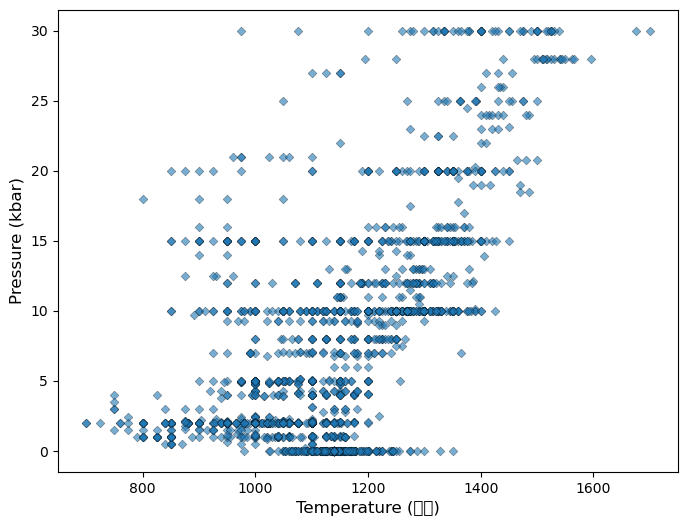

In [15]:
# combine Agreda reference model data for both P and T

Agreda_all_data_P = demo_model[2].X_cpx_all.copy()
Agreda_all_data_T = ModelManager.get_model(
    T_model_pool,
    model_name="Ágreda-López et al., 2024",
    T_P="T",
    cpx_only=True,
    exact=False,
    raise_if_empty=True,
).X_cpx_all.copy()

Agreda_all_data_P.set_index(keys="Sample_ID", inplace=True)
Agreda_all_data_T.set_index(keys="Sample_ID", inplace=True)
Agreda_all_data_P["T_C"] = Agreda_all_data_T["T_C"].copy()

fig, ax = plt.subplots(figsize=(8,6), dpi=100)
ax.scatter(Agreda_all_data_P["T_C"], Agreda_all_data_P["P_kbar"], alpha=0.6, s=20, edgecolors='k', linewidths=0.3)
ax.set_xlabel("Temperature (鎺矯)")
ax.set_ylabel("Pressure (kbar)")
demo_model[2].X_cpx_all = Agreda_all_data_P.reset_index()


In [16]:
# temporarily set Wang et al., 2021 training data as all data for convenience
demo_model[-3].X_cpx_all = demo_model[-3].X_cpx_training.copy()
demo_model[-3].X_liq_all = demo_model[-3].X_liq_training.copy()

In [17]:
demo_model

[
         ModelManager: Chicchi23
         Model name: Chicchi et al., 2023 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 0.9 kbar
         comment: None
         ,
 
         ModelManager: Petrelli20
         Model name: Petrelli et al., 2020 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.2 kbar
         comment: None
         ,
 
         ModelManager: Agreda2024
         Model name: Ágreda-López et al., 2024 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 2.5 kbar
         comment: None
         ,
 
         ModelManager: Higgins21
         Model name: Higgins et al., 2021 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 2.3 kbar
         comment: None
         ,
 
         ModelManager: Jorgenson22
         Model name: Jorgenson et al., 2022 (cpx_on

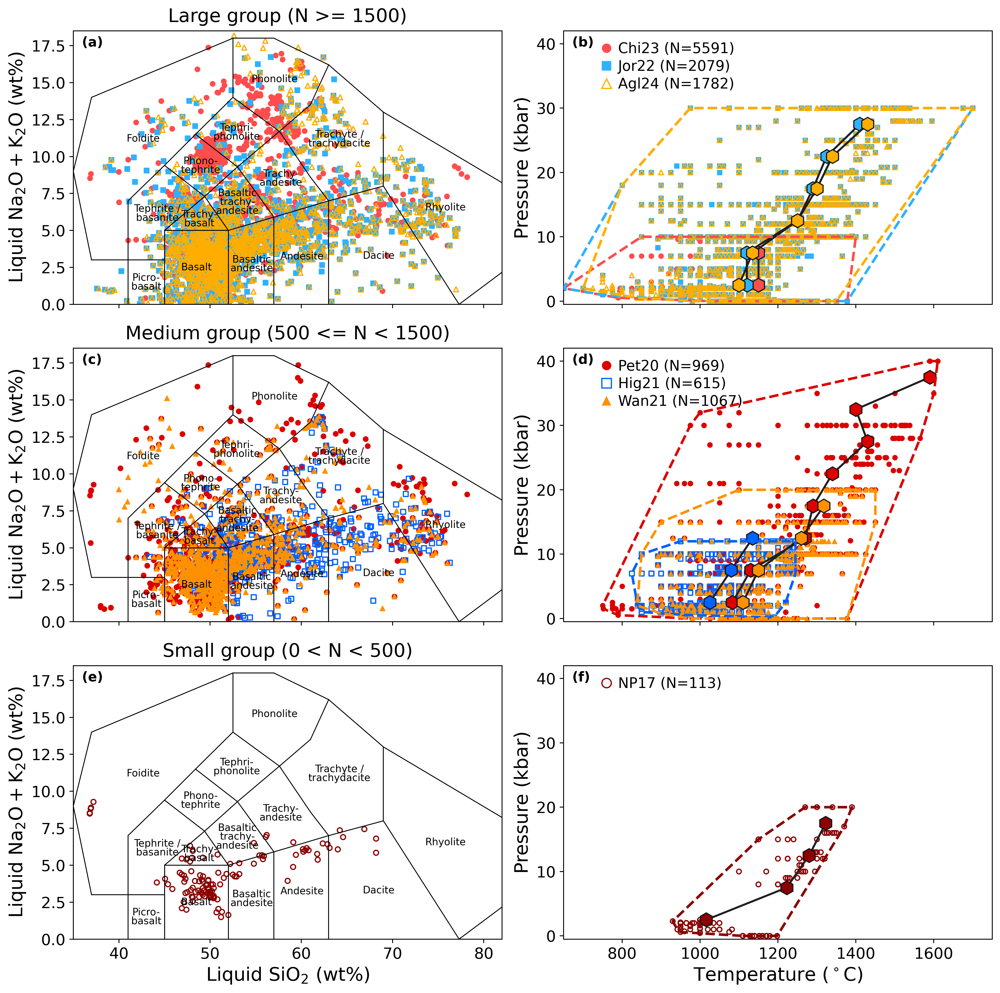

In [18]:
from paper.scripts.figure_helpers import (
    COLOR_CYCLE__nb00_c24 as COLOR_CYCLE,
    add_legend_fixed_ul__nb00_c24 as add_legend_fixed_ul,
    add_panel_labels__nb00_c24 as add_panel_labels,
    apply_figure_font_sizes,
    build_global_color_map__nb00_c24 as build_global_color_map,
    get_n_liq__nb00_c24 as get_n_liq,
    make_group_style__nb00_c24 as make_group_style,
    order_model_names_for_fig1__nb00_c24 as order_model_names_for_fig1,
    plot_tas_group__nb00_c24 as plot_tas_group,
    plot_tp_binned_median_trend__nb00_c24 as plot_tp_binned_median_trend,
    plot_tp_scatter_hull__nb00_c24 as plot_tp_scatter_hull,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt


LARGE_TH = 1500
MED_TH = 500

TAS_XLIM = (35, 82)
TAS_YLIM = (0, 18.5)
TP_XLIM = (600, 1750)
TP_YLIM = (-0.5, 42)

fig1_model_names = order_model_names_for_fig1(demo_model_name)
name2model = {n: m for n, m in zip(demo_model_name, demo_model)}
name2n = {n: get_n_liq(name2model[n]) for n in fig1_model_names}
global_color_map = build_global_color_map(fig1_model_names, COLOR_CYCLE)

large = [n for n in fig1_model_names if name2n[n] >= LARGE_TH]
medium = [n for n in fig1_model_names if MED_TH <= name2n[n] < LARGE_TH]
small = [n for n in fig1_model_names if 0 < name2n[n] < MED_TH]

rows = [
    ("Large", large, 1),
    ("Medium", medium, 1),
    ("Small", small, 1),
]
row_styles = {r: make_group_style(names, global_color_map, name2n=name2n) for r, names, _ in rows}

fig, axes = plt.subplots(3, 2, figsize=(12.5, 12.6), dpi=350)

for i, (row, names, min_bin) in enumerate(rows):
    ax_tas, ax_tp = axes[i]

    plot_tas_group(
        ax_tas,
        names,
        name2model,
        row_styles[row],
        scatter_style=dict(s=20, alpha=1, linewidths=0.7),
    )
    plot_tp_scatter_hull(
        ax_tp,
        names,
        name2model,
        row_styles[row],
        scatter_style=dict(s=18, alpha=1, linewidths=0.7),
    )
    plot_tp_binned_median_trend(
        ax_tp,
        names,
        name2model,
        row_styles[row],
        dp=5,
        min_per_bin=min_bin,
    )

    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"
    ax_tas.set_title(f"{row} group {rule}", pad=8)
    ax_tas.set_ylabel(r"Liquid $\mathrm{Na_2O + K_2O}$ (wt%)")
    ax_tp.set_ylabel("Pressure (kbar)")

    if i >= 2:
        ax_tas.set_xlabel(r"Liquid $\mathrm{SiO_2}$ (wt%)")
        ax_tp.set_xlabel(r"Temperature ($^\circ$C)")
    else:
        ax_tas.set_xlabel("")
        ax_tp.set_xlabel("")
        ax_tas.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)
        ax_tp.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)

    add_legend_fixed_ul(ax_tp, names, row_styles[row], name2n)

add_panel_labels(axes)
apply_figure_font_sizes(fig)
plt.tight_layout()
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_SX_calibration_datasets_of_models")
plt.show()

### TAS and P-T panels with georock data

C:\Users\13493\AppData\Local\Temp\ipykernel_74548\2040875085.py:1: DtypeWarning: Columns (18,28) have mixed types. Specify dtype option on import or set low_memory=False.
  georock_liq_df = pd.read_csv(os.path.join(DATA_DIR, "GEOROCK_liq", "04_georock_volcanic_glass_clean_with_setting.csv"))


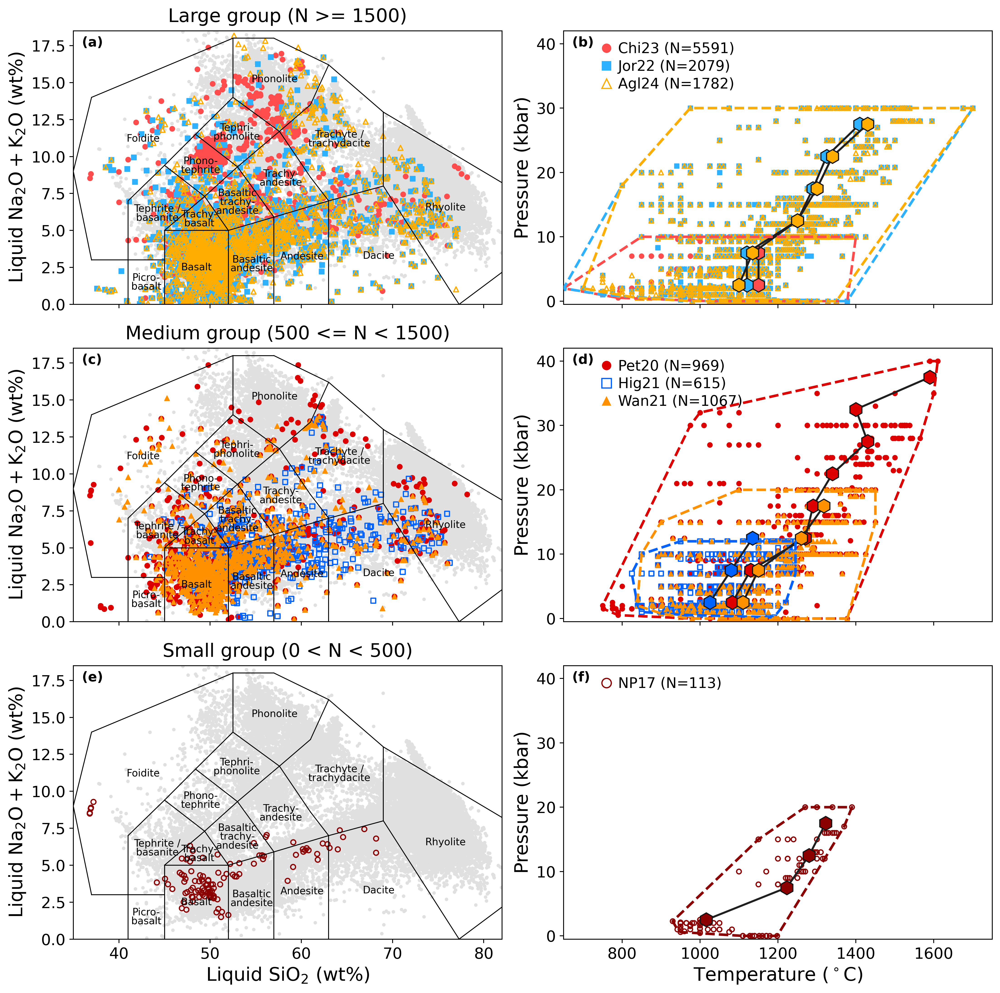

In [ ]:

georock_liq_df = pd.read_csv(os.path.join(DATA_DIR, "GEOROCK_liq", "04_georock_volcanic_glass_clean_with_setting.csv"))

from paper.scripts.figure_helpers import (
    COLOR_CYCLE__nb00_c24 as COLOR_CYCLE,
    add_legend_fixed_ul__nb00_c24 as add_legend_fixed_ul,
    add_panel_labels__nb00_c24 as add_panel_labels,
    apply_figure_font_sizes,
    build_global_color_map__nb00_c24 as build_global_color_map,
    get_n_liq__nb00_c24 as get_n_liq,
    make_group_style__nb00_c24 as make_group_style,
    order_model_names_for_fig1__nb00_c24 as order_model_names_for_fig1,
    plot_tas_group__nb00_c24 as plot_tas_group,
    plot_tp_binned_median_trend__nb00_c24 as plot_tp_binned_median_trend,
    plot_tp_scatter_hull__nb00_c24 as plot_tp_scatter_hull,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt


LARGE_TH = 1500
MED_TH = 500

TAS_XLIM = (35, 82)
TAS_YLIM = (0, 18.5)
TP_XLIM = (600, 1750)
TP_YLIM = (-0.5, 42)

fig1_model_names = order_model_names_for_fig1(demo_model_name)
name2model = {n: m for n, m in zip(demo_model_name, demo_model)}
name2n = {n: get_n_liq(name2model[n]) for n in fig1_model_names}
global_color_map = build_global_color_map(fig1_model_names, COLOR_CYCLE)

large = [n for n in fig1_model_names if name2n[n] >= LARGE_TH]
medium = [n for n in fig1_model_names if MED_TH <= name2n[n] < LARGE_TH]
small = [n for n in fig1_model_names if 0 < name2n[n] < MED_TH]

rows = [
    ("Large", large, 1),
    ("Medium", medium, 1),
    ("Small", small, 1),
]
row_styles = {r: make_group_style(names, global_color_map, name2n=name2n) for r, names, _ in rows}

fig, axes = plt.subplots(3, 2, figsize=(12.5, 12.6), dpi=350)

for i, (row, names, min_bin) in enumerate(rows):
    ax_tas, ax_tp = axes[i]

    plot_tas_group(
        ax_tas,
        names,
        name2model,
        row_styles[row],
        scatter_style=dict(s=20, alpha=1, linewidths=0.7),
        georock_liq_df=georock_liq_df,
    )
    plot_tp_scatter_hull(
        ax_tp,
        names,
        name2model,
        row_styles[row],
        scatter_style=dict(s=18, alpha=1, linewidths=0.7),
    )
    plot_tp_binned_median_trend(
        ax_tp,
        names,
        name2model,
        row_styles[row],
        dp=5,
        min_per_bin=min_bin,
    )

    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"
    ax_tas.set_title(f"{row} group {rule}", pad=8)
    ax_tas.set_ylabel(r"Liquid $\mathrm{Na_2O + K_2O}$ (wt%)")
    ax_tp.set_ylabel("Pressure (kbar)")

    if i >= 2:
        ax_tas.set_xlabel(r"Liquid $\mathrm{SiO_2}$ (wt%)")
        ax_tp.set_xlabel(r"Temperature ($^\circ$C)")
    else:
        ax_tas.set_xlabel("")
        ax_tp.set_xlabel("")
        ax_tas.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)
        ax_tp.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)

    add_legend_fixed_ul(ax_tp, names, row_styles[row], name2n)

add_panel_labels(axes)
apply_figure_font_sizes(fig)
plt.tight_layout()
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_2_calibration_datasets_of_models_with_georock_liq")
plt.show()

matrix glass in volcanic rocks from the GEORO database, 35 < SiO2 閳? 80 wt.%, major-element total 閸?95閳?05 wt%

## Compared with GEOROC

Clean GEOROC cpx data and compare cpx composition fields against the independent experimental dataset and calibration datasets.

In [20]:
# CELL: cleaning/screen georoc data georoc_df_cleaned = 
# a coarse cleaning
georoc_df_cleaned = georoc_df.copy()


for col in cpx_names:
    if col in georoc_df_cleaned.columns:
        georoc_df_cleaned[col] = pd.to_numeric(georoc_df_cleaned[col], errors="coerce")
    else:
        georoc_df_cleaned[col] = 0.0

print("Before cleaning, georoc_df_cleaned shape:", georoc_df_cleaned.shape)
cpx_total = georoc_df_cleaned[cpx_names].sum(axis=1)
georoc_df_cleaned = georoc_df_cleaned[(cpx_total > 97) & (cpx_total < 103)].reset_index(drop=True)
print("After total, georoc_df_cleaned shape:", georoc_df_cleaned.shape)
cpx_params = cpx_calculation(georoc_df_cleaned[cpx_names])



Before cleaning, georoc_df_cleaned shape: (209882, 456)
After total, georoc_df_cleaned shape: (15811, 456)


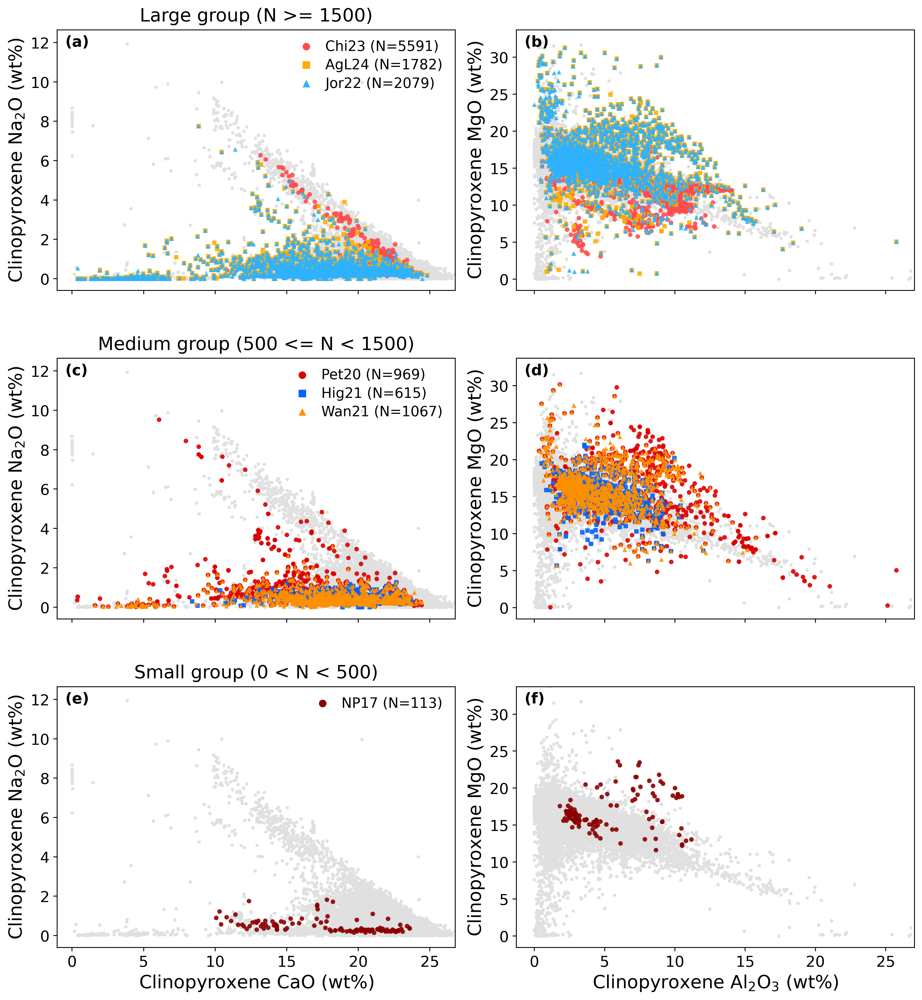

In [21]:
from paper.scripts.figure_helpers import (
    add_cpx_legend_fixed_ul__nb00_c27 as add_cpx_legend_fixed_ul,
    apply_figure_font_sizes,
    get_cpx_series__nb00_c27 as get_cpx_series,
    get_pair_limits__nb00_c27 as get_pair_limits,
    get_valid_xy__nb00_c27 as get_valid_xy,
    plot_cpx_pair__nb00_c27 as plot_cpx_pair,
    save_figure_pdf_png,
)

# Cpx composition comparison against GEOROC.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


AXIS_LABEL_SIZE = 15
TICK_LABEL_SIZE = 14
TITLE_SIZE = 16
LEGEND_FONT_SIZE = 11
LEGEND_MARKER_SIZE = 7
GEOROC_LIMIT_PERCENTILES = (1.0, 99.0)
PAIR_LIMITS_OVERRIDE = {
    ("CaO_cpx", "Na2O_cpx"): None,
    ("Al2O3_cpx", "MgO_cpx"): None,
}

cpx_pairs = [
    ("CaO_cpx", "Na2O_cpx", r"Clinopyroxene $\mathrm{CaO}$ (wt%)", r"Clinopyroxene $\mathrm{Na_2O}$ (wt%)"),
    ("Al2O3_cpx", "MgO_cpx", r"Clinopyroxene $\mathrm{Al_2O_3}$ (wt%)", r"Clinopyroxene $\mathrm{MgO}$ (wt%)"),
]
GEOROC_STYLE = dict(color="0.88", s=10, alpha=1, linewidths=0, marker="o", zorder=0)
GEOROC_LEGEND_STYLE = dict(color="0.88", alpha=1, markersize=LEGEND_MARKER_SIZE - 2)
MODEL_SCATTER_STYLE = dict(s=18, alpha=0.9, linewidths=0, zorder=3)


CPX_COLUMN_ALIASES = {
    "FeOt_cpx": ("FeO_cpx",),
    "FeO_cpx": ("FeOt_cpx",),
}




name2model = {name: model for name, model in zip(demo_model_name, demo_model)}
name2n = {name: get_n_liq(name2model[name]) for name in demo_model_name}

global_color_map = build_global_color_map(demo_model_name, COLOR_CYCLE)

large = [name for name in demo_model_name if name2n[name] >= LARGE_TH]
medium = [name for name in demo_model_name if MED_TH <= name2n[name] < LARGE_TH]
small = [name for name in demo_model_name if 0 < name2n[name] < MED_TH]

rows = [
    ("Large", large),
    ("Medium", medium),
    ("Small", small),
]
row_styles = {row: make_group_style(names, global_color_map) for row, names in rows}

georoc_plot_df = georoc_df_cleaned.copy()
for col in sorted({col for pair in cpx_pairs for col in pair[:2]}):
    georoc_plot_df[col] = pd.to_numeric(get_cpx_series(georoc_plot_df, col), errors="coerce")

pair_limits = {
    (x_col, y_col): get_pair_limits(
        name2model,
        georoc_plot_df,
        x_col,
        y_col,
        override_limits=PAIR_LIMITS_OVERRIDE[(x_col, y_col)],
    )
    for x_col, y_col, _, _ in cpx_pairs
}

fig, axes = plt.subplots(3, 2, figsize=(12, 13), dpi=350)

for i, (row, names) in enumerate(rows):
    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"

    for j, (x_col, y_col, x_label, y_label) in enumerate(cpx_pairs):
        ax = axes[i, j]
        georoc_n = plot_cpx_pair(ax, names, name2model, row_styles[row], georoc_plot_df, x_col, y_col)

        limits = pair_limits[(x_col, y_col)]
        if limits is not None:
            ax.set_xlim(limits[0], limits[1])
            ax.set_ylim(limits[2], limits[3])

        ax.set_ylabel(y_label, fontsize=AXIS_LABEL_SIZE)
        ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
        if i >= len(rows) - 1:
            ax.set_xlabel(x_label, fontsize=AXIS_LABEL_SIZE)
        else:
            ax.set_xlabel("")
            ax.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)

        if j == 0:
            ax.set_title(f"{row} group {rule}", fontsize=TITLE_SIZE, pad=8)
        else:
            ax.set_title("")

        if j == 0:
            add_cpx_legend_fixed_ul(
                ax,
                names,
                row_styles[row],
                name2n,
                georoc_n=georoc_n,
                include_georoc=False,
                loc="upper right",
                bbox_to_anchor=(0.98, 0.98),
            )

add_panel_labels(axes, fontsize=14)
apply_figure_font_sizes(fig)
plt.tight_layout()
plt.subplots_adjust(hspace=0.26)
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_S2_cpx_Na2O_CaO_MgO_Al2O3", dpi=250)
plt.show()


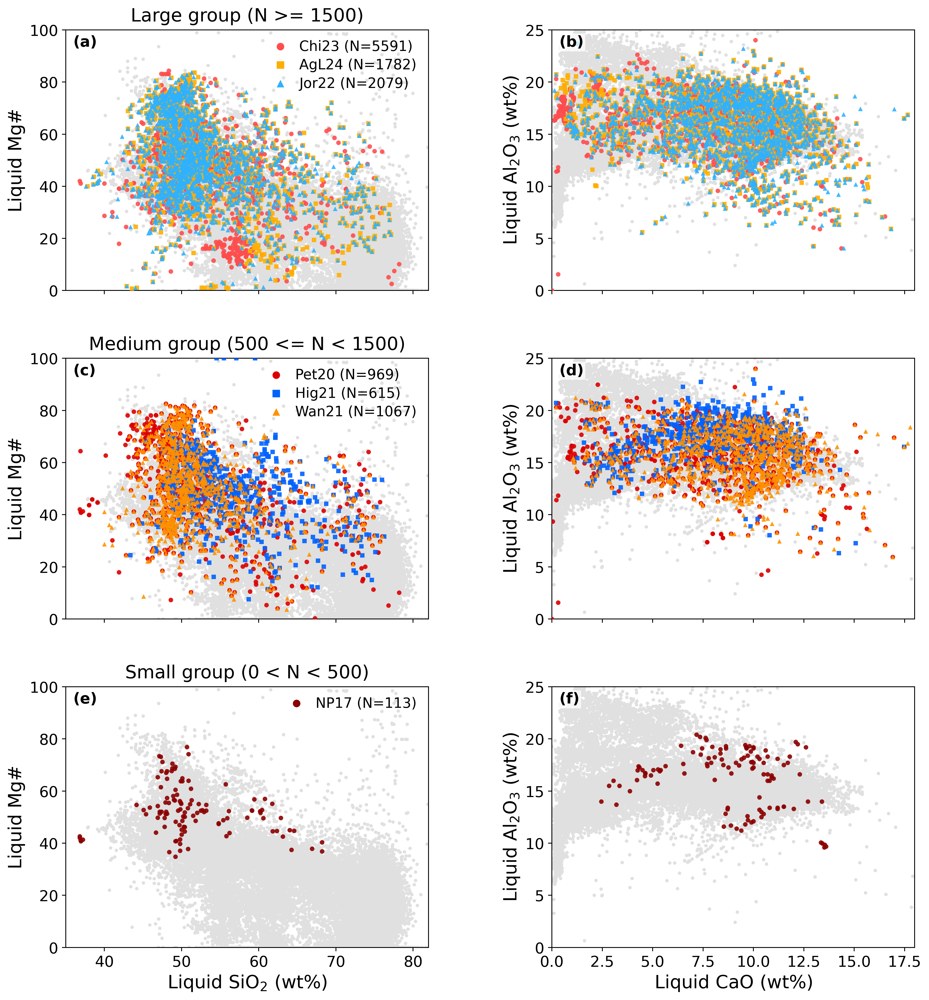

In [22]:
from paper.scripts.figure_helpers import (
    COLOR_CYCLE__nb00_c24 as COLOR_CYCLE,
    add_cpx_legend_fixed_ul__nb00_c28 as add_cpx_legend_fixed_ul,
    add_panel_labels__nb00_c24 as add_panel_labels,
    apply_figure_font_sizes,
    build_global_color_map__nb00_c24 as build_global_color_map,
    get_n_liq__nb00_c24 as get_n_liq,
    make_group_style__nb00_c24 as make_group_style,
    save_figure_pdf_png,
)

# Liquid composition comparison against GEOROC volcanic glass.
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


AXIS_LABEL_SIZE = 15
TICK_LABEL_SIZE = 14
TITLE_SIZE = 16
LEGEND_MARKER_SIZE = 7
GEOROC_LIMIT_PERCENTILES = (1.0, 99.0)
MOLAR_MASS_MGO = 40.3044
MOLAR_MASS_FEO = 71.844

LIQUID_PAIRS = [
    ("SiO2_liq", "MgNumber_liq", r"Liquid $\mathrm{SiO_2}$ (wt%)", r"Liquid Mg#"),
    ("CaO_liq", "Al2O3_liq", r"Liquid $\mathrm{CaO}$ (wt%)", r"Liquid $\mathrm{Al_2O_3}$ (wt%)"),
]
PAIR_LIMITS_OVERRIDE = {
    ("SiO2_liq", "MgNumber_liq"): (35, 82, 0, 100),
    ("CaO_liq", "Al2O3_liq"): (0, 18, 0, 25),
}
GEOROC_STYLE = dict(color="0.88", s=10, alpha=1, linewidths=0, marker="o", zorder=0, rasterized=True)
MODEL_SCATTER_STYLE = dict(s=18, alpha=0.9, linewidths=0, zorder=3)


def _numeric_series(df, col):
    """Return a numeric series, or all-NaN if the column is absent."""
    if col not in df.columns:
        return pd.Series(np.nan, index=df.index, dtype=float)
    return pd.to_numeric(df[col], errors="coerce")


def _first_numeric_series(df, cols):
    """Return the first non-missing value across candidate numeric columns."""
    out = pd.Series(np.nan, index=df.index, dtype=float)
    for col in cols:
        if col in df.columns:
            out = out.fillna(pd.to_numeric(df[col], errors="coerce"))
    return out


def _mg_number_percent(df, suffix):
    """Calculate molar Mg# on a 0-100 scale from MgO and FeO/FeOt."""
    mg = _numeric_series(df, f"MgO_{suffix}") / MOLAR_MASS_MGO
    fe = _first_numeric_series(df, [f"FeO_{suffix}", f"FeOt_{suffix}"]) / MOLAR_MASS_FEO
    denom = mg + fe
    return pd.Series(np.where(denom > 0, 100.0 * mg / denom, np.nan), index=df.index, dtype=float)


def _add_liquid_plot_columns(df):
    """Add derived liquid columns used by the S03 liquid composition panels."""
    out = df.copy()
    out["MgNumber_liq"] = _mg_number_percent(out, "liq")
    out["TotalAlkali_liq"] = _numeric_series(out, "Na2O_liq") + _numeric_series(out, "K2O_liq")
    return out


def _get_valid_xy(df, x_col, y_col):
    x = _numeric_series(df, x_col)
    y = _numeric_series(df, y_col)
    mask = np.isfinite(x) & np.isfinite(y)
    return x[mask], y[mask]


def _get_liquid_pair_limits(name2model, georoc_liq_df, x_col, y_col, *, pad_frac=0.05, override_limits=None):
    if override_limits is not None:
        return override_limits

    xs, ys = [], []
    gx, gy = _get_valid_xy(georoc_liq_df, x_col, y_col)
    if gx.size:
        lo, hi = GEOROC_LIMIT_PERCENTILES
        gx_lo, gx_hi = np.nanpercentile(gx, [lo, hi])
        gy_lo, gy_hi = np.nanpercentile(gy, [lo, hi])
        gmask = (gx >= gx_lo) & (gx <= gx_hi) & (gy >= gy_lo) & (gy <= gy_hi)
        xs.append(gx[gmask] if gmask.any() else gx)
        ys.append(gy[gmask] if gmask.any() else gy)

    for model in name2model.values():
        X_liq = getattr(model, "X_liq_all", None)
        if X_liq is None:
            continue
        liq_df = _add_liquid_plot_columns(X_liq)
        xi, yi = _get_valid_xy(liq_df, x_col, y_col)
        if xi.size:
            xs.append(xi)
            ys.append(yi)

    if not xs:
        return None

    x_all = pd.concat(xs).dropna()
    y_all = pd.concat(ys).dropna()
    if x_all.empty or y_all.empty:
        return None
    xmin, xmax = x_all.min(), x_all.max()
    ymin, ymax = y_all.min(), y_all.max()
    xpad = (xmax - xmin) * pad_frac if xmax > xmin else 0.5
    ypad = (ymax - ymin) * pad_frac if ymax > ymin else 0.5
    return xmin - xpad, xmax + xpad, ymin - ypad, ymax + ypad


def _plot_liquid_pair(ax, model_names, name2model, name2style, georoc_liq_df, x_col, y_col):
    gx, gy = _get_valid_xy(georoc_liq_df, x_col, y_col)
    ax.scatter(gx, gy, **GEOROC_STYLE)

    for name in model_names:
        X_liq = getattr(name2model[name], "X_liq_all", None)
        if X_liq is None:
            continue
        liq_df = _add_liquid_plot_columns(X_liq)
        xi, yi = _get_valid_xy(liq_df, x_col, y_col)
        if xi.size == 0:
            continue
        style = name2style[name]
        ax.scatter(
            xi,
            yi,
            c=[style["color"]],
            marker=style["marker"],
            **MODEL_SCATTER_STYLE,
        )

    return gx.size


if "georock_liq_df" not in globals():
    georock_liq_df = pd.read_csv(
        os.path.join(DATA_DIR, "GEOROCK_liq", "04_georock_volcanic_glass_clean_with_setting.csv"),
        low_memory=False,
    )

name2model = {name: model for name, model in zip(demo_model_name, demo_model)}
name2n = {name: get_n_liq(name2model[name]) for name in demo_model_name}
global_color_map = build_global_color_map(demo_model_name, COLOR_CYCLE)

large = [name for name in demo_model_name if name2n[name] >= LARGE_TH]
medium = [name for name in demo_model_name if MED_TH <= name2n[name] < LARGE_TH]
small = [name for name in demo_model_name if 0 < name2n[name] < MED_TH]
rows = [
    ("Large", large),
    ("Medium", medium),
    ("Small", small),
]
row_styles = {row: make_group_style(names, global_color_map) for row, names in rows}

georock_liq_plot_df = _add_liquid_plot_columns(georock_liq_df)
pair_limits = {
    (x_col, y_col): _get_liquid_pair_limits(
        name2model,
        georock_liq_plot_df,
        x_col,
        y_col,
        override_limits=PAIR_LIMITS_OVERRIDE[(x_col, y_col)],
    )
    for x_col, y_col, _, _ in LIQUID_PAIRS
}

fig, axes = plt.subplots(3, 2, figsize=(12, 13), dpi=350)

for i, (row, names) in enumerate(rows):
    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"

    for j, (x_col, y_col, x_label, y_label) in enumerate(LIQUID_PAIRS):
        ax = axes[i, j]
        _plot_liquid_pair(ax, names, name2model, row_styles[row], georock_liq_plot_df, x_col, y_col)

        limits = pair_limits[(x_col, y_col)]
        if limits is not None:
            ax.set_xlim(limits[0], limits[1])
            ax.set_ylim(limits[2], limits[3])

        ax.set_ylabel(y_label, fontsize=AXIS_LABEL_SIZE)
        ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
        if i >= len(rows) - 1:
            ax.set_xlabel(x_label, fontsize=AXIS_LABEL_SIZE)
        else:
            ax.set_xlabel("")
            ax.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)

        if j == 0:
            ax.set_title(f"{row} group {rule}", fontsize=TITLE_SIZE, pad=8)
            add_cpx_legend_fixed_ul(
                ax,
                names,
                row_styles[row],
                name2n,
                include_georoc=False,
                loc="upper right",
                bbox_to_anchor=(0.98, 0.98),
            )
        else:
            ax.set_title("")

add_panel_labels(axes, fontsize=14)
apply_figure_font_sizes(fig)
plt.tight_layout()
plt.subplots_adjust(hspace=0.26, wspace=0.34)
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_S3_liq_Mg#_SiO2_alkaline_SiO2", dpi=250)
plt.show()


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(
c:\Users\13493\miniconda3\envs\AIMS4PT\li

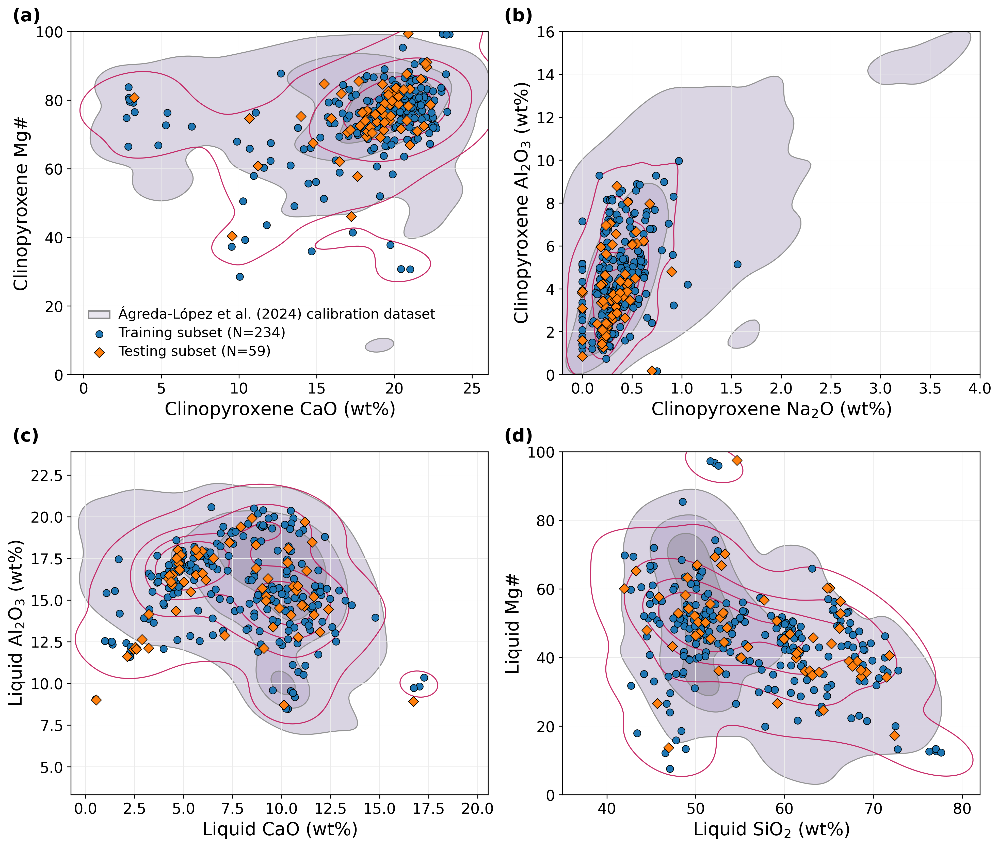

In [23]:
from paper.scripts.figure_helpers import (
    _get_agreda_reference_model__nb00_c16 as _get_agreda_reference_model,
    add_panel_label_yaxis_aligned,
    apply_figure_font_sizes,
    save_figure_pdf_png,
)

# Independent dataset composition panels using the same visual language as Figure 4.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


MOLAR_MASS_MGO = 40.3044
MOLAR_MASS_FEO = 71.844
REFERENCE_FILL = "#D8D2E3"
REFERENCE_EDGE = "0.55"
TRAINING_KDE = "#C2185B"
REFERENCE_LABEL = "Ágreda-López et al. (2024)"


def _numeric_series(df, col):
    """Return a numeric series, or all-NaN if the column is absent."""
    if col not in df.columns:
        return pd.Series(np.nan, index=df.index, dtype=float)
    return pd.to_numeric(df[col], errors="coerce")


def _first_numeric_series(df, cols):
    """Return the first non-missing value across candidate numeric columns."""
    out = pd.Series(np.nan, index=df.index, dtype=float)
    for col in cols:
        if col in df.columns:
            out = out.fillna(pd.to_numeric(df[col], errors="coerce"))
    return out


def _mg_number_percent(df, suffix):
    """Calculate molar Mg# on a 0-100 scale from MgO and FeO/FeOt."""
    mg = _numeric_series(df, f"MgO_{suffix}") / MOLAR_MASS_MGO
    fe = _first_numeric_series(df, [f"FeO_{suffix}", f"FeOt_{suffix}"]) / MOLAR_MASS_FEO
    denom = mg + fe
    return pd.Series(np.where(denom > 0, 100.0 * mg / denom, np.nan), index=df.index, dtype=float)


def _add_composition_plot_columns(df, suffix):
    """Add derived composition columns used by the independent-dataset panels."""
    out = df.copy()
    out[f"MgNumber_{suffix}"] = _mg_number_percent(out, suffix)
    if suffix == "liq":
        out["TotalAlkali_liq"] = _numeric_series(out, "Na2O_liq") + _numeric_series(out, "K2O_liq")
    return out


def _valid_xy(df, x_col, y_col):
    x = _numeric_series(df, x_col)
    y = _numeric_series(df, y_col)
    mask = np.isfinite(x) & np.isfinite(y)
    return x[mask], y[mask]


def _set_pair_limits(ax, x_series, y_series, pad_frac=0.05):
    """Set panel limits from all visible datasets."""
    x_all = pd.concat(x_series).dropna()
    y_all = pd.concat(y_series).dropna()
    if x_all.empty or y_all.empty:
        return
    xmin, xmax = x_all.min(), x_all.max()
    ymin, ymax = y_all.min(), y_all.max()
    xpad = (xmax - xmin) * pad_frac if xmax > xmin else 0.5
    ypad = (ymax - ymin) * pad_frac if ymax > ymin else 0.5
    ax.set_xlim(xmin - xpad, xmax + xpad)
    ax.set_ylim(ymin - ypad, ymax + ypad)


def _draw_kde(ax, x, y, *, fill, color, linewidth, alpha, levels, zorder):
    """Draw a guarded 2-D KDE so sparse panels still render."""
    data = pd.DataFrame({"x": x, "y": y}).dropna()
    if len(data) < 5 or data["x"].nunique() < 2 or data["y"].nunique() < 2:
        return
    try:
        sns.kdeplot(
            data=data,
            x="x",
            y="y",
            fill=fill,
            color=color,
            linewidth=linewidth,
            alpha=alpha,
            levels=levels,
            warn_singular=False,
            ax=ax,
            zorder=zorder,
        )
    except Exception:
        return


agreda_P_model = _get_agreda_reference_model("P")
agreda_reference_cpx = _add_composition_plot_columns(agreda_P_model.X_cpx_all.copy(), "cpx")
agreda_reference_liq = _add_composition_plot_columns(agreda_P_model.X_liq_all.copy(), "liq")
independent_cpx = _add_composition_plot_columns(cpx_unseen.copy(), "cpx")
independent_liq = _add_composition_plot_columns(liq_unseen.copy(), "liq")

composition_panels = [
    ("cpx", "CaO_cpx", "MgNumber_cpx", r"Clinopyroxene $\mathrm{CaO}$ (wt%)", r"Clinopyroxene Mg#"),
    ("cpx", "Na2O_cpx", "Al2O3_cpx", r"Clinopyroxene $\mathrm{Na_2O}$ (wt%)", r"Clinopyroxene $\mathrm{Al_2O_3}$ (wt%)"),
    ("liq", "CaO_liq", "Al2O3_liq", r"Liquid $\mathrm{CaO}$ (wt%)", r"Liquid $\mathrm{Al_2O_3}$ (wt%)"),
    ("liq", "SiO2_liq", "MgNumber_liq", r"Liquid $\mathrm{SiO_2}$ (wt%)", r"Liquid Mg#"),
]

fig, axes = plt.subplots(2, 2, figsize=(13, 11), dpi=300, layout="constrained")
axes_flat = axes.ravel()

for panel_id, (ax, (phase, x_col, y_col, x_label, y_label)) in enumerate(zip(axes_flat, composition_panels)):
    reference_df = agreda_reference_cpx if phase == "cpx" else agreda_reference_liq
    independent_df = independent_cpx if phase == "cpx" else independent_liq

    ref_x, ref_y = _valid_xy(reference_df, x_col, y_col)
    train_x, train_y = _valid_xy(independent_df.loc[training_unseen_id], x_col, y_col)
    test_x, test_y = _valid_xy(independent_df.loc[testing_unseen_id], x_col, y_col)

    _draw_kde(ax, ref_x, ref_y, fill=True, color=REFERENCE_FILL, linewidth=0.9, alpha=0.55, levels=4, zorder=0)
    _draw_kde(ax, ref_x, ref_y, fill=False, color=REFERENCE_EDGE, linewidth=1.2, alpha=0.9, levels=4, zorder=1)
    _draw_kde(ax, train_x, train_y, fill=False, color=TRAINING_KDE, linewidth=2.0, alpha=0.9, levels=5, zorder=2)

    ax.scatter(
        train_x,
        train_y,
        color="C0",
        marker="o",
        label=f"Training subset (N={len(training_unseen_id)})",
        s=46,
        edgecolors="k",
        linewidths=0.6,
        alpha=1,
        zorder=3,
    )
    ax.scatter(
        test_x,
        test_y,
        color="C1",
        marker="D",
        label=f"Testing subset (N={len(testing_unseen_id)})",
        s=46,
        edgecolors="k",
        linewidths=0.6,
        alpha=1,
        zorder=4,
    )

    _set_pair_limits(ax, [ref_x, train_x, test_x], [ref_y, train_y, test_y])
    if x_col == "Na2O_cpx" and y_col == "Al2O3_cpx":
        # Focus panel b on the independent dataset cloud while retaining modest margins.
        ax.set_xlim(-0.2, 4)
        ax.set_ylim(0, 16)
    if y_col.startswith("MgNumber"):
        ax.set_ylim(0, 100)
    if x_col == "SiO2_liq":
        ax.set_xlim(35, 82)

    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.grid(True, color="0.92", linewidth=0.5, zorder=0)
    add_panel_label_yaxis_aligned(ax, f"({chr(97 + panel_id)})", x=-0.14, y=1.07, bbox=False)

handles, labels = axes_flat[0].get_legend_handles_labels()
reference_handle = Patch(
    facecolor=(216 / 255, 210 / 255, 227 / 255, 0.55),
    edgecolor=REFERENCE_EDGE,
    linewidth=1.4,
    label=f"{REFERENCE_LABEL} calibration dataset",
)
axes_flat[0].legend(
    [reference_handle, *handles],
    [reference_handle.get_label(), *labels],
    loc="lower left",
    frameon=False,
    fontsize=10,
    bbox_to_anchor=(0.02, 0.02),
    bbox_transform=axes_flat[0].transAxes,
)

apply_figure_font_sizes(fig)
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_S6_independent_cpx_liq_composition_pairs", dpi=300)
plt.show()


(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/Fig_S1_cpx_component_distributions.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/Fig_S1_cpx_component_distributions.png'))

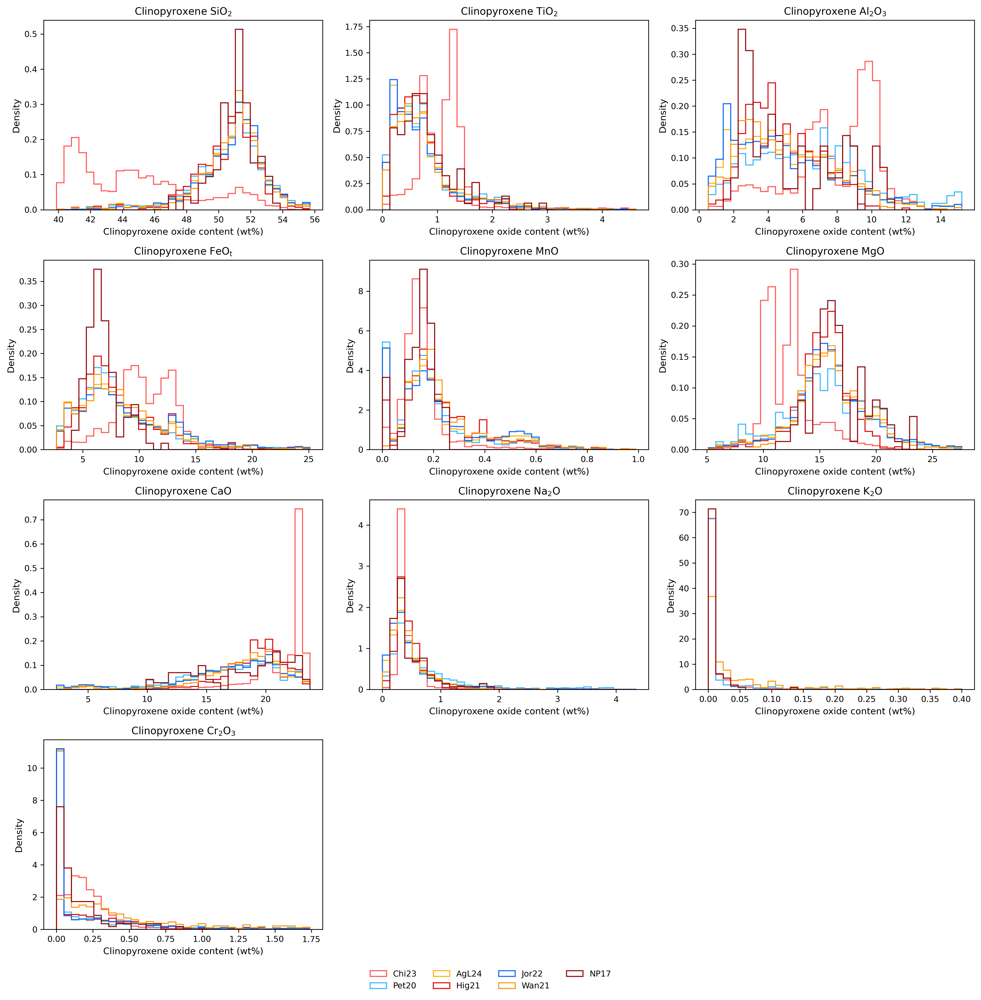

In [24]:
from paper.scripts.figure_helpers import (
    get_existing_cpx_series__nb00_c29 as get_existing_cpx_series,
    save_figure_pdf_png,
)

# cell: histogram of cpx compositions, consider all compositions.
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

required_globals = ["demo_model", "demo_model_name"]
missing = [name for name in required_globals if name not in globals()]
if missing:
    raise NameError(f"Missing required objects: {missing}. Run the setup cells first.")

hist_cpx_names = [
    "SiO2_cpx", "TiO2_cpx", "Al2O3_cpx", "FeOt_cpx", "MnO_cpx",
    "MgO_cpx", "CaO_cpx", "Na2O_cpx", "K2O_cpx", "Cr2O3_cpx",
]

CPX_COLUMN_ALIASES = {
    "FeOt_cpx": ("FeO_cpx",),
    "FeO_cpx": ("FeOt_cpx",),
}
CPX_HIST_LABELS = {
    "SiO2_cpx": r"Clinopyroxene $\mathrm{SiO_2}$",
    "TiO2_cpx": r"Clinopyroxene $\mathrm{TiO_2}$",
    "Al2O3_cpx": r"Clinopyroxene $\mathrm{Al_2O_3}$",
    "FeOt_cpx": r"Clinopyroxene $\mathrm{FeO_t}$",
    "MnO_cpx": r"Clinopyroxene $\mathrm{MnO}$",
    "MgO_cpx": r"Clinopyroxene $\mathrm{MgO}$",
    "CaO_cpx": r"Clinopyroxene $\mathrm{CaO}$",
    "Na2O_cpx": r"Clinopyroxene $\mathrm{Na_2O}$",
    "K2O_cpx": r"Clinopyroxene $\mathrm{K_2O}$",
    "Cr2O3_cpx": r"Clinopyroxene $\mathrm{Cr_2O_3}$",
}




hist_frames = []
for name, model in zip(demo_model_name, demo_model):
    X_cpx = getattr(model, "X_cpx_all", None)
    if X_cpx is None:
        continue
    for col in hist_cpx_names:
        series = get_existing_cpx_series(X_cpx, col)
        if series is None:
            continue
        values = pd.to_numeric(series, errors="coerce")
        values = values[np.isfinite(values)]
        if values.empty:
            continue
        hist_frames.append(pd.DataFrame({"model": name, "oxide": col, "value": values.to_numpy()}))

if not hist_frames:
    raise ValueError("No model cpx composition data found for the selected oxide columns.")
cpx_hist_df = pd.concat(hist_frames, ignore_index=True)

n_cols = 3
n_rows = math.ceil(len(hist_cpx_names) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows), dpi=300)
axes = np.asarray(axes).ravel()

model_names = list(cpx_hist_df["model"].drop_duplicates())
model_colors = {name: COLOR_CYCLE[i % len(COLOR_CYCLE)] for i, name in enumerate(model_names)} if "COLOR_CYCLE" in globals() else None
legend_handles = {}

for ax, col in zip(axes, hist_cpx_names):
    oxide_df = cpx_hist_df[cpx_hist_df["oxide"].eq(col)]
    values = oxide_df["value"]
    if values.empty:
        ax.set_visible(False)
        continue

    x_min, x_max = np.nanpercentile(values, [0.5, 99.5])
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        x_min, x_max = values.min(), values.max()
    bins = np.linspace(x_min, x_max, 35) if x_min < x_max else 20

    for model_name in model_names:
        group_values = oxide_df.loc[oxide_df["model"].eq(model_name), "value"]
        group_values = group_values[(group_values >= x_min) & (group_values <= x_max)]
        if group_values.empty:
            continue
        hist_kwargs = dict(histtype="step", linewidth=1.2, alpha=0.9)
        if model_colors is not None:
            hist_kwargs["color"] = model_colors[model_name]
        _, _, patches = ax.hist(group_values, bins=bins, density=True, label=model_name, **hist_kwargs)
        if model_name not in legend_handles and patches:
            legend_handles[model_name] = patches[0]

    ax.set_title(CPX_HIST_LABELS.get(col, f"Clinopyroxene {col.replace('_cpx', '')}"), fontsize=11)
    ax.set_xlabel("Clinopyroxene oxide content (wt%)", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)
    ax.tick_params(labelsize=9)

for ax in axes[len(hist_cpx_names):]:
    ax.set_visible(False)

if legend_handles:
    fig.legend(
        [legend_handles[name] for name in model_names if name in legend_handles],
        [name for name in model_names if name in legend_handles],
        loc="lower center",
        bbox_to_anchor=(0.5, 0.05),
        ncol=min(4, len(legend_handles)),
        frameon=False,
        fontsize=9,
    )



fig.tight_layout(rect=(0, 0.08, 1, 1))

# save.
save_figure_pdf_png(fig, IMAGES_DIR, "Fig_S1_cpx_component_distributions")
